#### Итоговая работа Гущина Алексея Николаевича, студента курса "Аналитик данных (Data scientist)" МГТУ им. Н.Э.Баумана

***Цель работы:***

   На входе имеются данные о начальных свойствах компонентов композиционных материалов (количество связующего, наполнителя, температурный режим отверждения и т.д.). На основании этих начальных свойств необходимо разработать модели для прогноза модуля упругости при растяжении, прочности при растяжении и соотношения «матрица-наполнитель».

***Задачи работы:***

   1. Обучить алгоритм машинного обучения, который будет определять значения:

        - Модуль упругости при растяжении, ГПа
        - Прочность при растяжении, МПа

   2. Написать нейронную сеть, которая будет рекомендовать:
        - Соотношение матрица-наполнитель

## 1. Импортируем необходимые библиотеки

In [2]:
# Импортируем необходимые библиотеки
import numpy as np
import pandas as pd
from scipy.stats import randint, uniform

# Библиотеки для работы с графикой
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

#Библиотеки для препроцессинга и машинного обучения
from sklearn.preprocessing import LabelEncoder, Normalizer, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.multioutput import MultiOutputRegressor, RegressorChain
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

#Библиотеки для реализации нейронной сети
from keras.models import Sequential
from keras.layers import Input, Dense, Activation, Dropout, BatchNormalization, Normalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras_tuner.tuners import GridSearch
from tensorflow.keras.optimizers import Adam

pio.templates.default= 'plotly_dark'
plt.style.use('dark_background')
import warnings
warnings.filterwarnings('ignore')

## 2. Загружаем данные в блокнот и проводим разведочный анализ данных

In [3]:
# Загружаем данные и объединяем датасеты в один по пересечению индекса
data_bp = pd.read_excel('X_bp.xlsx', index_col=0)
data_bp.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","Модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342


In [4]:
data_nup = pd.read_excel('X_nup.xlsx', index_col=0)
data_nup.tail()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479
1039,90,9.021043,66.920143


In [5]:
# Объединение датасета
data = pd.concat([data_bp, data_nup], axis=1, join='inner')
data.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","Модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


In [6]:
# Проверим размеры полученного датасета
data.shape

(1023, 13)

In [7]:
# Создадим информативную таблицу для первичной оценки нашего датасета
data_info = pd.DataFrame({
    'Тип данных': data.dtypes,
    'Пропущенные значения': data.isna().sum(),
    'Уникальные значения': data.nunique(),
    'Дубликаты': data.duplicated().sum()
}).sort_values('Пропущенные значения', ascending=False)

data_info['Доля пропущенных значений'] = round(data_info['Пропущенные значения'] / len(data), 2)

data_info

,Тип данных,Пропущенные значения,Уникальные значения,Дубликаты,Доля пропущенных значений
Соотношение матрица-наполнитель,float64,0,1014,0,0.0
"Плотность, кг/м3",float64,0,1013,0,0.0
"Модуль упругости, ГПа",float64,0,1020,0,0.0
"Количество отвердителя, м.%",float64,0,1005,0,0.0
"Содержание эпоксидных групп,%_2",float64,0,1004,0,0.0
"Температура вспышки, С_2",float64,0,1003,0,0.0
"Поверхностная плотность, г/м2",float64,0,1004,0,0.0
"Модуль упругости при растяжении, ГПа",float64,0,1004,0,0.0
"Прочность при растяжении, МПа",float64,0,1004,0,0.0
"Потребление смолы, г/м2",float64,0,1003,0,0.0


In [8]:
# Столбец 'Угол нашивки' имеет всего два уникальных значения. Посмотрим на его распределение.
data['Угол нашивки, град'].value_counts()

Угол нашивки, град
0     520
90    503
Name: count, dtype: int64

При первом взгляде можно сделать несколько выводов:
1. Отсутствуют пропущенные значения и дубликаты.
2. Все столбцы имеют числовой тип значений.
3. Столбец `Угол нашивки` можно отнести к категориальной величине (имеется только 2 значения: 0 и 90). Попробуем воспользоваться этим и закодировать его в дальнейшем, чтобы исключить сильный разброс двух значений показателя между собой.

In [9]:
# Взглянем на описательную статистику по датасету.
data.describe(include='all').round(2).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.93,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",1023.0,1975.73,73.73,1731.76,1924.16,1977.62,2021.37,2207.77
"Модуль упругости, ГПа",1023.0,739.92,330.23,2.44,500.05,739.66,961.81,1911.54
"Количество отвердителя, м.%",1023.0,110.57,28.30,17.74,92.44,110.56,129.73,198.95
"Содержание эпоксидных групп,%_2",1023.0,22.24,2.41,14.25,20.61,22.23,23.96,33.00
"Температура вспышки, С_2",1023.0,285.88,40.94,100.00,259.07,285.90,313.00,413.27
"Поверхностная плотность, г/м2",1023.0,482.73,281.31,0.60,266.82,451.86,693.23,1399.54
"Модуль упругости при растяжении, ГПа",1023.0,73.33,3.12,64.05,71.25,73.27,75.36,82.68
"Прочность при растяжении, МПа",1023.0,2466.92,485.63,1036.86,2135.85,2459.52,2767.19,3848.44
"Потребление смолы, г/м2",1023.0,218.42,59.74,33.80,179.63,219.20,257.48,414.59


Из описательной статистики заметен сильный разброс данных в столбцах `Модуль упругости` и `Поверхностная плотность`. Продолжим разбираться в деталях и перейдем к анализу распределения данных и поиску выбросов.

In [10]:
#Построим графики распределения значений по столбцам. Первым графиком будет 'Box' на котором попробуем оценить количество и распределение выбросов.
data_for_image = data.drop('Угол нашивки, град', axis=1) # удаляем столбец, который будет неинформатным в нашей визуализации
fig = make_subplots(rows=3, cols=4,
                    horizontal_spacing=0.01, vertical_spacing=0.05)

row = 1
col = 1
for i, column in enumerate(data_for_image.columns):
    fig.add_trace(go.Box(y=data_for_image[column], name=column, marker_color='#f48ff2', opacity=.5), row=row, col=col)
    col += 1
    if col > 4:
        col = 1
        row += 1

fig.update_layout(height=1000, width=1200, title_text="Распределение данных и визуализация выбросов", showlegend=False)
fig.show()

По всем параметрам видны выбросы на графике, но на первый взгляд их незначительное количество и они находятся не слишком далеко от верхних и нижних границ основного распределения данных.

In [11]:
#Следующим графиком распределения будет гистограмма
fig = make_subplots(rows=3, cols=4, subplot_titles=data_for_image.columns,
                    horizontal_spacing=0.05, vertical_spacing=0.1)

row = 1
col = 1
for i, column in enumerate(data_for_image.columns):
    fig.add_trace(go.Histogram(x=data_for_image[column], marker_color='#920b8e', opacity=.5), row=row, col=col)
    col += 1
    if col > 4:
        col = 1
        row += 1

fig.update_layout(height=800, width=1400, title_text="Распределение данных", showlegend=False)
fig.show()

Графики показывают соответствие нормальному распределению с незначительным количеством выбросов.

Переходим к анализу количества выбросов в каждом из столбцов.

In [12]:
# Вычисляем квартили и IQR
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

# Подсчитываем количество выбросов
count_out = data[(data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))].count()
# Создаем DataFrame с количеством выбросов
df_count_out = pd.DataFrame(count_out, columns=['Количество выбросов'])
# Вычисляем общее количество значений в каждом столбце
total_values = data.count()
# Вычисляем доли выбросов
df_count_out['Доля выбросов, %'] = round(df_count_out['Количество выбросов'] / total_values * 100, 2)
# Отобразим DataFrame с количеством выбросов и их долей
df_count_out


,Количество выбросов,"Доля выбросов, %"
Соотношение матрица-наполнитель,6,0.59
"Плотность, кг/м3",9,0.88
"Модуль упругости, ГПа",2,0.20
"Количество отвердителя, м.%",14,1.37
"Содержание эпоксидных групп,%_2",2,0.20
"Температура вспышки, С_2",8,0.78
"Поверхностная плотность, г/м2",2,0.20
"Модуль упругости при растяжении, ГПа",6,0.59
"Прочность при растяжении, МПа",11,1.08
"Потребление смолы, г/м2",8,0.78


Как мы видим из таблицы, выбросы составляют менее одного процента от числа значений в большинстве столбцов. В свою очередь это данные, которые хотелось бы сохранить, т.к. они являются частью небольшого набора и их удаление может сказаться на общей предсказательной возможности моделей.
Различные модели демонстрируют разный уровень чувствительности к выбросам, что требует вдумчивого подхода на этапе построения модели. Мы оценим влияние выбросов на выбранную нами модель и примем решение об их удалении в дальнейшем.

Перейдем к рассмотрению корреляции между признаками

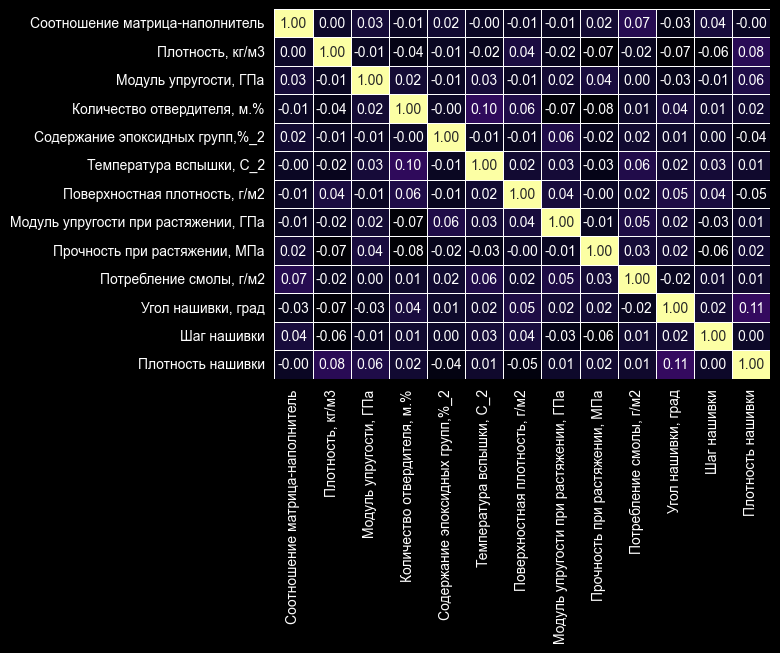

In [13]:
#Визуализируем корреляцию между признаками в нашем наборе данных (метод 'pearson')
sns.heatmap(data.corr(), cbar=False, annot=True, fmt='.2f', cmap='inferno', linewidths=.5);

График показывает, что не существует сильной корреляции между признаками в нашем наборе данных, что позволяет нам сохранить все признаки в нём в неизменном виде. В свою очередь низкий показатель корреляции говорит о том, что моделям будет сложно найти зависимости между нашими целевыми переменными и остальным признаковым пространством. Что ж, тем интереснее будет процесс подбора и поиска наилучшей модели.

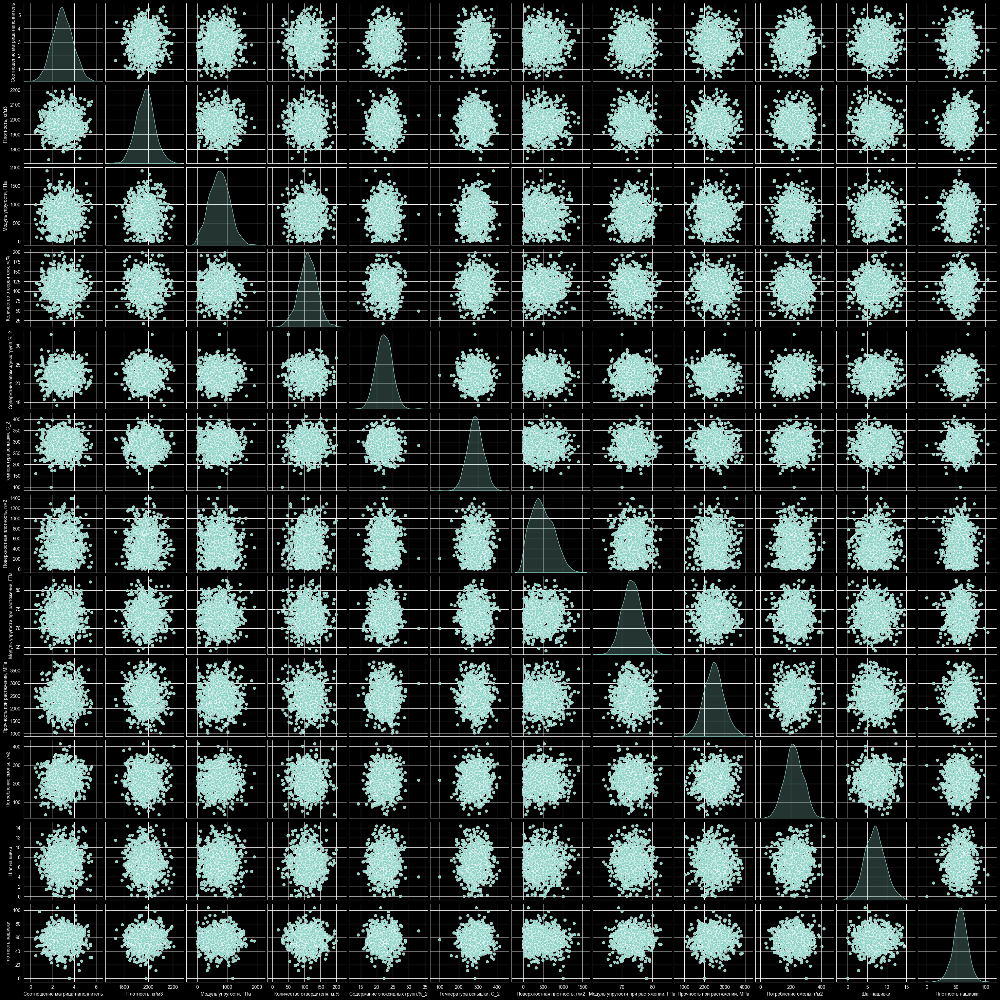

In [14]:
# Смотрим типы зависимостей между признаками
sns.pairplot(data_for_image, diag_kind='kde', palette='husl');

Делаем вывод, что между признаками не прослеживается явной линейной зависимости.

Переходим к кодированию признака `Угол нашивки, град`, а также изменению имени столбца после кодирования.

In [15]:
# Делаем копию нашего исходного датасета
data_clear = data.copy()

# Инициализируем кодировщик и преобразуем наш признак
LE = LabelEncoder()
data_clear['Угол нашивки, град'] = LE.fit_transform(data_clear['Угол нашивки, град'])

# Изменяем имя столбца и смотрим обновленный датасет
data_clear = data_clear.rename(columns={'Угол нашивки, град': 'Угол нашивки'})
data_clear.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","Модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [16]:
# Перепроверяем распределение признака `Угол нашивки`
data_clear['Угол нашивки'].value_counts()

Угол нашивки
0    520
1    503
Name: count, dtype: int64

Размерности признаков в нашем датасете сильно отличаются друг от друга, поэтому нам необходимо нормальзовать его. Существует несколько способов привести датасет к единой размерности - это стандартизация (приведение к нулевому среднему и единичному стандартному отклонению) и нормализация (приведение к диапазону от 0 до 1).
Учитывая что между параметрами отсутствуют линейные зависимости, а их соотношение между собой представляет из себя облачное распределение, попробуем воспользоваться методом Normalizer, который нормализует образцы по отдельности к единичной норме.

In [17]:
# Инициализируем Normalizer и применяем к нашему датасету.
norm = Normalizer()
data_norm = norm.fit_transform(data_clear)
data_norm = pd.DataFrame(data_norm, columns=data_clear.columns)
data_norm.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","Модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,0.000500,0.546880,0.199015,0.008082,0.005999,0.026940,0.056574,0.018858,0.808197,0.059268,0.0,0.001078,0.015356
1,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.0,0.001075,0.016121
2,0.000499,0.545401,0.198477,0.013407,0.008866,0.076468,0.056421,0.018807,0.806011,0.059107,0.0,0.001075,0.018807
3,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.0,0.001342,0.012618
4,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.0,0.001342,0.015298
5,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.0,0.001348,0.016178
6,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.0,0.001361,0.019055
7,0.000942,0.698599,0.196711,0.041129,0.008188,0.104648,0.139720,0.027576,0.661831,0.044122,0.0,0.002574,0.017281
8,0.001255,0.681080,0.313720,0.045523,0.007499,0.105867,0.134099,0.026467,0.635204,0.042347,0.0,0.002470,0.020115
9,0.001035,0.615094,0.416213,0.037784,0.006224,0.087871,0.295831,0.022846,0.585803,0.087871,0.0,0.002050,0.017574


In [18]:
# Посмотрим на статистику данных в новой размерности
data_norm.describe().round(5).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,0.00088,0.00029,0.00012,0.00068,0.00087,0.00107,0.00192
"Плотность, кг/м3",1023.0,0.59695,0.06861,0.42044,0.55109,0.59165,0.64114,0.87446
"Модуль упругости, ГПа",1023.0,0.22088,0.09628,0.00071,0.15096,0.22028,0.29094,0.52510
"Количество отвердителя, м.%",1023.0,0.03347,0.00953,0.00456,0.02730,0.03332,0.03950,0.07349
"Содержание эпоксидных групп,%_2",1023.0,0.00672,0.00106,0.00405,0.00597,0.00666,0.00740,0.01089
"Температура вспышки, С_2",1023.0,0.08642,0.01579,0.02694,0.07564,0.08494,0.09664,0.14796
"Поверхностная плотность, г/м2",1023.0,0.14464,0.08393,0.00023,0.08086,0.13823,0.20274,0.41437
"Модуль упругости при растяжении, ГПа",1023.0,0.02216,0.00264,0.01523,0.02035,0.02196,0.02382,0.03302
"Прочность при растяжении, МПа",1023.0,0.73006,0.07374,0.43038,0.68708,0.74040,0.78153,0.88245
"Потребление смолы, г/м2",1023.0,0.06593,0.01930,0.01072,0.05259,0.06540,0.07824,0.14539


## 3. Построение моделей классического машинного обучения

Теперь, когда мы подготовили наш датасет и нормализовали его переходим к построению моделей для прогнозирования наших переменных "модуля упругости при растяжении" и "прочности при растяжении" методами классического машинного обучения. Здесь стоит отметить, что перед нами стоит задача регрессии с несколькими выходами. Регрессию с множественным выходом и использованием библиотеки Scikit-learn можно выполнить тремя способами:

1. Использование моделей, поддерживающих множественную регрессию, такие как LinearRegression, RandomForestRegressor, KNeighborsRegressor и ряд других.
2. Использование MultiOutputRegressor, который выступает здесь в качестве оболочки для обучения моделей не предназначенных для множественной регрессии.
3. Использование связанных цепочек регрессии, где мы организуем отдельные регрессионные модели в последовательность, используя RegressorChain.

Для практических целей воспользуемся всеми тремя способами.

In [19]:
# Выделим из нашего датасета целевую переменную
y = data_norm[['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']]
X = data_norm.drop(['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1)

In [20]:
# Разделим на обучающую и тестовую выборку наши данные
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=24)

In [21]:
# Убедимся, что наборы обучающей и тестовой выборки разделены верно
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((818, 11), (205, 11), (818, 2), (205, 2))

In [22]:
# Создадим функцию для получения результатов оценки модели
def model_result(model_name):
    mse = round(mean_squared_error(y_test, y_pred).astype('float32'), 5)
    mae = round(mean_absolute_error(y_test, y_pred).astype('float32'), 5)
    r2 = round(r2_score(y_test, y_pred), 2)

    table_result = pd.DataFrame({'Model': model_name,
                          'MSE': [mse],
                          'MAE': [mae],
                          'R2': [r2]})
    return table_result

# А также функцию, которая выведет в таблице тестовые и предсказанные значения
def comparison_table(y_test, y_pred):
    y_pred = pd.DataFrame(y_pred,
                          columns=['Предсказанное значение Модуля упругости при растяжении, ГПа',
                                   'Предсказанное значение Прочности при растяжении, МПа'],
                          index=y_test.index)
    table_comparison = pd.concat([round(y_test, 5), round(y_pred, 5)], axis=1)

    return table_comparison

### 3.1 Использование моделей, поддерживающих множественную регрессию

Напомним, что мы сохранили выбросы, поэтому необходимо использовать модели, которые менее чувствительны к ним.

Из таких моделей можно выделить: Decision Tree, Random Forest, Gradient Boosting, SVM и ряд других.

#### 3.1.1 Модель Random Forest

In [23]:
# Инициализируем модель Random Forest и обучаем её
rf = RandomForestRegressor(random_state=24)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=24)

In [24]:
# Получаем предсказания модели
y_pred = rf.predict(X_test)

In [25]:
# Оцениваем модель
rf_result = model_result('RandomForestRegressor')
rf_result

,Model,MSE,MAE,R2
0,RandomForestRegressor,0.00012,0.00447,0.85


In [26]:
# Выведем таблицу сравнения тестовых и предсказанных значений
comparison_table(y_test, y_pred).head(7)

,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Предсказанное значение Модуля упругости при растяжении, ГПа","Предсказанное значение Прочности при растяжении, МПа"
491,0.02017,0.77910,0.02178,0.77569
627,0.02327,0.76373,0.02182,0.76076
392,0.02034,0.73202,0.02101,0.73322
37,0.02416,0.46314,0.02450,0.56980
54,0.02185,0.72647,0.02334,0.72438
612,0.01904,0.85159,0.01765,0.84495
476,0.02056,0.74082,0.02029,0.74120


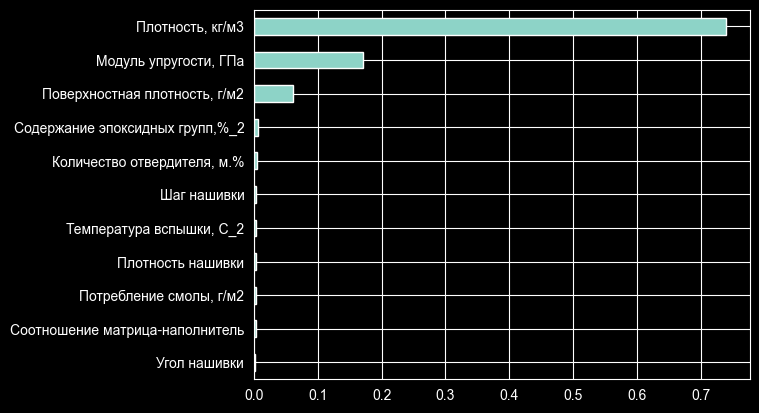

In [27]:
# Построим график и посмотрим на процент влияния каждого из признаков на наши целевые переменные
data_featuters = pd.Series(rf.feature_importances_, index = X_train.columns)
data_featuters.sort_values(inplace=True)
data_featuters.plot.barh();

Результаты неплохие, R2 (коэффициен детерминации) находится на достаточно высоком уровне 0.85, что говорит о том, что модель хорошо предсказывает изменения в данных. Больший вклад (более 70%) в предсказание целевых переменных вносит признак `Плотность`.

Идем дальше, на очереди модель KNeighbors

#### 3.1.2 Модель KNeighbors (метод ближайших соседей)

In [28]:
# Инициализируем модель KNeighborsRegressor и обучим её
knn = KNeighborsRegressor()
knn.fit(X_train, y_train)

KNeighborsRegressor()

In [29]:
# Предсказываем целевые переменные
y_pred = knn.predict(X_test)

In [30]:
# Оцениваем модель
knn_result = model_result('KNeighborsRegressor')
knn_result

,Model,MSE,MAE,R2
0,KNeighborsRegressor,0.00019,0.00585,0.8


In [31]:
# Взглянем на таблицу тестовых и предсказанных значений
comparison_table(y_test, y_pred).head(7)

,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Предсказанное значение Модуля упругости при растяжении, ГПа","Предсказанное значение Прочности при растяжении, МПа"
491,0.02017,0.77910,0.02202,0.78822
627,0.02327,0.76373,0.02210,0.75812
392,0.02034,0.73202,0.02132,0.72400
37,0.02416,0.46314,0.02351,0.56420
54,0.02185,0.72647,0.02432,0.72642
612,0.01904,0.85159,0.01842,0.84828
476,0.02056,0.74082,0.02060,0.73359


Результаты также неплохие - значение показателя R2 на уровне 0.8.

#### 3.1.3 Модель xGradient Boosting

In [32]:
# Инициализируем модель xgboostregressor с параметрами, которые дадут большую устойчивость к выбросам в нашем датасете.
xgb = XGBRegressor(max_depth=4,
                   min_child_weight=10,
                   subsample=.8,
                   colsample_bytree=.7,
                   reg_lambda=1,
                   learning_rate=.1,
                   random_state=24)

In [33]:
# Обучаем модель на нашем датасете
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=10, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=24, ...)

In [34]:
# Определяем предсказанные моделью данные
y_pred = xgb.predict(X_test)

In [35]:
# Оцениваем модель
xgb_result = model_result('XGBRegressor')
xgb_result

,Model,MSE,MAE,R2
0,XGBRegressor,0.00007,0.00382,0.89


In [36]:
# Выведем таблицу тестовых и предсказанных значений
comparison_table(y_test, y_pred).head(7)

,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Предсказанное значение Модуля упругости при растяжении, ГПа","Предсказанное значение Прочности при растяжении, МПа"
491,0.02017,0.77910,0.02112,0.78021
627,0.02327,0.76373,0.02207,0.76288
392,0.02034,0.73202,0.02145,0.71334
37,0.02416,0.46314,0.02463,0.55876
54,0.02185,0.72647,0.02362,0.71217
612,0.01904,0.85159,0.01792,0.84535
476,0.02056,0.74082,0.02069,0.74644


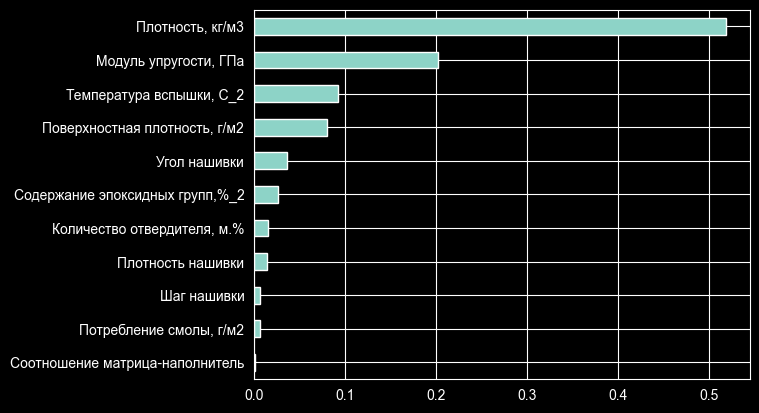

In [37]:
# Также взглянем на признаки, которые модель посчитала более 'влиятельными' на наши целевые переменные
data_featuters = pd.Series(xgb.feature_importances_, index = X_train.columns)
data_featuters.sort_values(inplace=True)
data_featuters.plot.barh();

У нас появился лидер! Значение R2 у модели лучше (0.89) по сравнению с моделью RandomForest у которой данный показатель - 0.85 и моделью KNeighbors со значением в 0.8. Также мы видим на графике, что вариативность наших целевых переменных в большей степени (более 70%) объясняется изменением таких признаков как `плотность` и `модуль упругости`.

Остановимся на этом и перейдем к использованию функции MultiOutputRegressor, которая будет выступать в качестве оболочки для обучения моделей не предназначенных для множественной регрессии

### 3.2 Использование функции MultiOutputRegressor

Апробируем эту функцию на модели SVR (метод опорных векторов) с параметрами модели, которые обеспечат большую устойчивость к выбросам в датасете.

Здесь мы будем обучать отдельную модель для каждой целевой переменной. Это простой способ расширить возможности моделей, которые по своей природе не предназначены для задач множественной регрессии.

In [38]:
# Инициализируем модель в оболочке функции MultiOutput и обучим её на наших данных
svr_multi = MultiOutputRegressor(SVR(kernel='rbf', C=10, gamma='scale', epsilon=.2))
svr_multi.fit(X_train, y_train)

MultiOutputRegressor(estimator=SVR(C=10, epsilon=0.2))

In [39]:
# Определим моделью предсказанные значения
y_pred = svr_multi.predict(X_test)

In [40]:
# Выведем таблицу оценки результатов модели
svr_multi_result = model_result('SVR_Multi')
svr_multi_result

,Model,MSE,MAE,R2
0,SVR_Multi,0.00482,0.04493,-0.6


Результат заметно хуже предыдущих моделей. Отрицательный показатель R2 говорит о том, что данная модель хуже, чем простая средняя.

Переходим к третьему варианту получения предсказаний в множественной регрессии - организация отдельных регрессионных моделей в последовательность, используя RegressorChain.

### 3.3 Использование функции RegressorChain

В этом подходе мы объединяем отдельные регрессионные модели в последовательность или 'цепочку'. Каждая модель в цепочке предсказывает целевую метку на основе всех доступных входных признаков и предсказаний предыдущих моделей в последовательности. Эта стратегия построения цепочки использует как информацию о признаках, так и выводы, сделанные на основе предсказаний предыдущих моделей, чтобы сделать точные предсказания для нескольких выходов. Как и в предыдущем примере используем регрессионную модель опорных векторов (SVR), которая не предназначена для множественной регрессии.

In [41]:
# Инициализируем модель в оболочке функции RegressorChain и обучим её на наших данных
svr_chain = RegressorChain(SVR(kernel='rbf', C=10, epsilon=.2, gamma='scale'))
svr_chain.fit(X_test, y_test)

RegressorChain(base_estimator=SVR(C=10, epsilon=0.2))

In [42]:
# Определим предсказания модели и посмотрим на показатели оценки
y_pred = svr_chain.predict(X_test)
svr_chain_result = model_result('SVR_Chain')
svr_chain_result

,Model,MSE,MAE,R2
0,SVR_Chain,0.00493,0.04572,-0.48


Результат показателя R2 = -0.48 лучше, чем с использованием оболочки MultiOutputRegressor (значение R2: -0.6), но все же далек от показателей моделей, которые поддерживают множественную регрессию.

### Подбор гиперпараметров

Хорошим подспорьем будет провести тюнинг двух наших лучших моделей, для того чтобы приблизиться к максимально возможным показателям оценки. Сделать это можно методом перебора гиперпараметров моделей в результате которых определяются наилучшие по показателям оценки параметры модели.

Из возможных вариантов перебора гиперпараметров остановимся на классе `RandomizedSearchCV`, который случайным образом перебирает параметры модели и определяет лучшие. Преимущество этого варианта в том, что в большинстве случаев случайный поиск даст сопоставимый результат быстрее, чем поиск по сетке (`GridSearchCV`).

Используем подбор гиперпараметров на следующих моделях:

   - RandomForest (показатель R2: 0.85)
   - XGBoost (показатель R2: 0.89)

In [43]:
# Инициализируем модель RandomForestRegressor
rf = RandomForestRegressor(random_state=24)

# Определим сетку параметров для модели
param_grid = {'n_estimators': randint(50, 150),
              'max_depth': randint(4, 20),
              'min_samples_leaf': randint(1, 5),
              'bootstrap': [True, False]}

# Настраиваем RandomizedSearchCV
rf_cv = RandomizedSearchCV(rf, param_grid, cv=5, n_jobs=-1, n_iter=20, random_state=24)

# Поиск лучших параметров
rf_cv.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=24),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001D33F738BC0>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001D341A26F30>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001D3419F7E90>},
                   random_state=24)

In [44]:
# Выведем лучшие параметры и лучшую оценку
print(f'Лучшие параметры:  {rf_cv.best_params_}')
print(f'Лучшая оценка R2: {rf_cv.best_score_:.3f}')

Лучшие параметры:  {'bootstrap': True, 'max_depth': 13, 'min_samples_leaf': 1, 'n_estimators': 95}
Лучшая оценка R2: 0.868


In [45]:
# Примерим лучшие параметры на наши тестовые данные
y_pred = rf_cv.predict(X_test)

In [46]:
# Выведем итоговую оценку модели
rf_cv_result = model_result('RandomForestRegressor_CV')
rf_cv_result

,Model,MSE,MAE,R2
0,RandomForestRegressor_CV,0.00012,0.00456,0.85


Использование RandomizedSearchCV не привело к значительному улучшению. Значение R2 находится на том же уровне - 0.85.

Переходим к модели XGBoost.

In [47]:
# Инициализируем модель xgboostregressor
xgb = XGBRegressor(random_state=24)

# Определим сетку параметров для модели
param_grid = {'n_estimators': randint(50, 200),
              'max_depth': randint(3, 20),
              'learning_rate': uniform(0.01, 0.7),
              'min_child_weight': randint(2, 15)}

# Настраиваем RandomizedSearchCV
xgb_cv = RandomizedSearchCV(xgb, param_grid, cv=5, n_jobs=-1, n_iter=30, random_state=24)

# Поиск лучших параметров
xgb_cv.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                   param_distributions={'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001D341AFFD10>,
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001D33F756480>,
                                        'min_child_weight': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001D33F43E840>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001D33F77A330>},
                   random_state=24)

In [48]:
# Посмотрим на лучшие параметры и лучшую оценку
print(f'Лучшие параметры:  {xgb_cv.best_params_}')
print(f'Лучшая оценка R2: {xgb_cv.best_score_:.3f}')

Лучшие параметры:  {'learning_rate': np.float64(0.06184882397926026), 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 198}
Лучшая оценка R2: 0.884


In [49]:
# Примерим лучшие параметры на наши тестовые данные
y_pred = xgb_cv.predict(X_test)

In [50]:
# Выведем итоговую оценку модели
xgb_cv_result = model_result('XGBRegressor_CV')
xgb_cv_result

,Model,MSE,MAE,R2
0,XGBRegressor_CV,0.00007,0.00354,0.89


Здесь также не удалось обеспечить значительный прирост точности в предсказании. Значение R2 находится на том же уровне 0.89, но мы видим незначительное снижение средней абсолютной ошибки до 0,00354 против 0.00382 в модели XGBRegressor без поиска наилучших параметров.

Пришло время подвести итог первой части нашей работы, подготовить сравнительную таблицу всех моделей и определить наилучшую модель по показателям:

   - R2 (коэффициент детермнации)
   - MSA (средняя абсолютная ошибка)
   - MSE (средняя квадратичная ошибка)

In [51]:
# Подготовим сравнительную таблицу моделей
general_result = pd.concat([rf_result, knn_result, xgb_result, svr_multi_result, svr_chain_result, rf_cv_result, xgb_cv_result], axis=0, ignore_index=True)
general_result.sort_values('MAE', ascending=True)

,Model,MSE,MAE,R2
6,XGBRegressor_CV,0.00007,0.00354,0.89
2,XGBRegressor,0.00007,0.00382,0.89
0,RandomForestRegressor,0.00012,0.00447,0.85
5,RandomForestRegressor_CV,0.00012,0.00456,0.85
1,KNeighborsRegressor,0.00019,0.00585,0.80
3,SVR_Multi,0.00482,0.04493,-0.60
4,SVR_Chain,0.00493,0.04572,-0.48


Исходя из вышеописанного можно сделать вывод, что лучшей моделью, которая имеет наименьшую среднюю абсолютную ошибку (0.00354) и высокий уровень коэффициента детерминации (0.89) является модель **XGBRegressor_CV**. Именно её можно рекомендовать, как наилучшую модель для предсказания значений 'Модуль упругости при растяжении' и 'Прочность при растяжении'

## 4. Построение нейронной сети

Переходим к не менее интересной главе нашей итоговой работы - применение нейронной сети в задаче регрессии целевой переменной `Соотношение матрица-наполнитель`.

Воспользуемся библиотекой TеnsorFlow для построения нейронной сети, а также используем модуль KerasTuner для перебора гиперпараметров и поиска наиболее лучшей модели.

Учитывая, что у нас новая целевая переменная `Соотношение матрица-наполнитель`, необходимо переопределить X и y в нашем датасете, после чего разобъем их на обучающую и тестовую выборку. Применим также отдельный слой нормализации из библиотеки Keras.

Но первым делом, поработаем с выбросами. Стоит отметить, что нейронные сети чувствительны к выбросам, хотя и можно сгладить их влияние используя более устойчивые метрики, регуляризацию. В качестве практической работы попробуем исключить выбросы из датасета (напомним, что в первой части работы мы их сохраняли). Это позволит нам получить более качественную нейронную сеть с лучшей предсказательной способностью.

In [52]:
# Первое, сделаем независимою копию нашего датасета для предобработки данных для нейронной сети
data_NN = data_clear.copy()
data_NN.shape

(1023, 13)

In [53]:
# Еще раз посмотрим на выбросы способом межквартильного размаха и удалим их
Q1 = data_NN.quantile(.25)
Q3 = data_NN.quantile(.75)
IQR = Q3 - Q1

# Определим верхние и нижние границы
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

# Удаляем выбросы и оценим размеры
data_NN = data_NN[~((data_NN < lower) | (data_NN > upper)).any(axis=1)].reset_index(drop=True)
data_NN.shape

(936, 13)

In [54]:
# Посмотрим на наличие выбросов еще раз
Q1 = data_NN.quantile(0.25)
Q3 = data_NN.quantile(0.75)
IQR = Q3 - Q1

count_out = data_NN[(data_NN < (Q1 - 1.5 * IQR)) | (data_NN > (Q3 + 1.5 * IQR))].count()
count_out

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
Модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       3
dtype: int64

Значительное количество выбросов отсеялось, но в ряде столбцов они еще сохраняются. Продолжаем манипулирование.

In [55]:
# Удаляем оставшиеся выбросы и смотрим на результат
Q1 = data_NN.quantile(0.25)
Q3 = data_NN.quantile(0.75)
IQR = Q3 - Q1

data_NN = data_NN[~((data_NN < (Q1 - 1.5 * IQR)) | (data_NN > (Q3 + 1.5 * IQR))).any(axis=1)].reset_index(drop=True)

count_out = data_NN[(data_NN < (Q1 - 1.5 * IQR)) | (data_NN > (Q3 + 1.5 * IQR))].count()
count_out

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
Модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Чисто. Двигаемся дальше.

In [56]:
# Оценим размеры после удаления выбросов
data_NN.shape

(926, 13)

Порядка 10% данных было удалено. Не исключена вероятность, что мы потеряли значимые заканомерности, поэтому посмотрим на результаты оценки нейронной сети и примем решение о возвращении к полному датасету.

Оценим на графике распределение данных и наличие выбросов, после их удаления.

In [57]:
# Построим гистограммы распределения по каждому признаку
data_for_image = data_NN.drop('Угол нашивки', axis=1) # удаляем столбец, который будет неинформатным для нашей визуализации

for col in data_for_image.columns:
    fig = px.histogram(data_for_image[col], marginal='box', opacity=.7, title=f'Распределение "{col}"', height=400, width=550)
    fig.update_layout(showlegend=False)
    fig.update_traces(marker_color='#c979ea')
    fig.show()

На графиках видно относительно нормальное распределение значений и отсутствие выбросов.

Переходим к разделению на целевую переменную и признаки. Здесь же скажем, что нормализацию данных будем проводить отдельным нейронным слоем Normalizer.

In [58]:
# Выделяем из датасета целевую переменную и определяем признаковое пространство
X = data_NN.copy()
y = X.pop('Соотношение матрица-наполнитель')

In [59]:
# Разделим на обучающую и тестовую выборку наши данные
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=24)

In [60]:
# Убедимся, что наборы обучающей и тестовой выборки разделены верно
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((740, 12), (186, 12), (740,), (186,))

In [61]:
# Определим слой нормализации
norm = Normalization(axis=-1)
norm_layer = norm.adapt(np.asarray(X).astype('float32'))

In [62]:
# Создадим функцию для построения модели с различными гиперпараметрами
def build_model(hp):
    # Инициализируем модель и добавим слои нейронов
    activation_choice = hp.Choice('activation', values=['relu', 'tanh']) # параметры функции активации
    learning_rate_choice = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])    # параметры скорости обучения

    model = Sequential()
    norm_layer
    model.add(Dense(units = hp.Int('units_hidden_1', min_value=64, max_value=128, step=32), activation=activation_choice))
    model.add(Dropout(0.2))
    model.add(Dense(units = hp.Int('units_hidden_2', min_value=32, max_value=64, step=16), activation=activation_choice))

    # Выходной слой
    model.add(Dense(units = 1, activation='linear'))

    # Компиляция модели
    model.compile(loss='mae', optimizer=Adam(learning_rate=learning_rate_choice), metrics=['mse', 'r2_score'])

    return model

Исходя из того, что датасет имеет небольшие размеры, предлагается остановиться на тюнере GridSearch, который перебирает все гиперпараметры и определяет их наилучшую комбинацию.

In [63]:
# Инициализируем сам тюнер и настроим его
tuner = GridSearch(hypermodel=build_model,
                           objective='val_loss',
                           max_trials=10,
                           seed=24)

In [64]:
# Запускаем процесс подбора гиперпараметров
tuner.search(X_train, y_train, epochs=50, validation_split=.2, verbose=0)

In [65]:
# Выведем результаты поиска
tuner.results_summary()

Results summary
Results in .\untitled_project
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 01 summary
Hyperparameters:
activation: relu
learning_rate: 0.01
units_hidden_1: 64
units_hidden_2: 48
Score: 0.7099742889404297

Trial 02 summary
Hyperparameters:
activation: relu
learning_rate: 0.01
units_hidden_1: 64
units_hidden_2: 64
Score: 0.712114691734314

Trial 07 summary
Hyperparameters:
activation: relu
learning_rate: 0.01
units_hidden_1: 128
units_hidden_2: 48
Score: 0.7181320190429688

Trial 03 summary
Hyperparameters:
activation: relu
learning_rate: 0.01
units_hidden_1: 96
units_hidden_2: 32
Score: 0.7183935642242432

Trial 06 summary
Hyperparameters:
activation: relu
learning_rate: 0.01
units_hidden_1: 128
units_hidden_2: 32
Score: 0.7192785143852234

Trial 08 summary
Hyperparameters:
activation: relu
learning_rate: 0.01
units_hidden_1: 128
units_hidden_2: 64
Score: 0.7217433452606201

Trial 05 summary
Hyperparameters:
activation: relu
learning_rate: 0.

In [66]:
# Получим лучшие значения гиперпараметров и создадим модель на их основе
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_model = tuner.hypermodel.build(best_hps)

In [67]:
# Обучим модель с лучшими гиперпараметрами на наших обучающих данных
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True) # oпределяем callback EarlyStopping (ранняя остановка)

history = best_model.fit(X_train, y_train, epochs=200, validation_split=.2, callbacks=[early_stopping], verbose=2)

Epoch 1/200
19/19 - 2s - 93ms/step - loss: 140.3118 - mse: 39482.9375 - r2_score: -4.9141e+04 - val_loss: 14.8052 - val_mse: 354.1824 - val_r2_score: -4.5576e+02
Epoch 2/200
19/19 - 0s - 5ms/step - loss: 26.9272 - mse: 1277.1536 - r2_score: -1.5886e+03 - val_loss: 17.4136 - val_mse: 345.0987 - val_r2_score: -4.4405e+02
Epoch 3/200
19/19 - 0s - 4ms/step - loss: 14.9575 - mse: 349.8334 - r2_score: -4.3442e+02 - val_loss: 3.9841 - val_mse: 22.1360 - val_r2_score: -2.7547e+01
Epoch 4/200
19/19 - 0s - 8ms/step - loss: 9.2270 - mse: 136.3897 - r2_score: -1.6876e+02 - val_loss: 2.0273 - val_mse: 7.5324 - val_r2_score: -8.7141e+00
Epoch 5/200
19/19 - 0s - 4ms/step - loss: 5.5956 - mse: 57.7828 - r2_score: -7.0919e+01 - val_loss: 5.2323 - val_mse: 33.9750 - val_r2_score: -4.2815e+01
Epoch 6/200
19/19 - 0s - 8ms/step - loss: 4.3662 - mse: 30.8347 - r2_score: -3.7378e+01 - val_loss: 1.8012 - val_mse: 4.9162 - val_r2_score: -5.3401e+00
Epoch 7/200
19/19 - 0s - 4ms/step - loss: 2.5677 - mse: 12.556

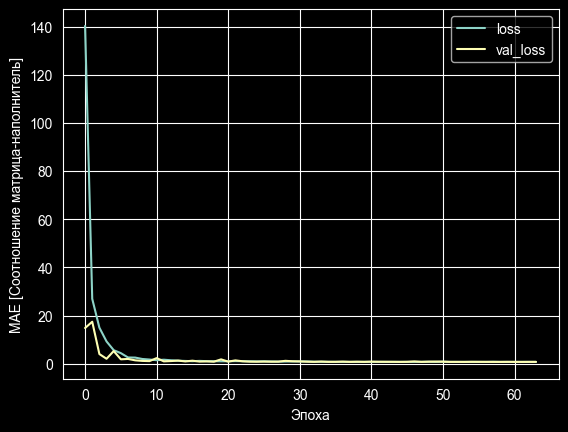

In [68]:
# Для наглядности посмотрим на график обучения
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Эпоха')
plt.ylabel('MAE [Соотношение матрица-наполнитель]')
plt.legend()
plt.grid(True)
plt.show()

In [69]:
# Оценим модель на тестовых данных
loss, mse, r2_score = best_model.evaluate(X_test, y_test)
tab_result = pd.DataFrame({'Model': 'Neural_Network',
                            'MSE': [mse],
                            'MAE': [loss],
                            'R2': [r2_score]})
tab_result

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7354 - mse: 0.8851 - r2_score: -0.1235


,Model,MSE,MAE,R2
0,Neural_Network,0.896149,0.735548,-0.121917


Подведем итог по второй части нашей работы в которой для решения задачи регрессии нами была использована нейронная сеть. Результаты прогнозирования, несмотря на тюнинг модели, а также проведенную работу по выбросам оказались неудволетворительными. R2 находится в отрицательной зоне, что говорит о том, что предсказательная способность модели находится на низком уровне.

**Можно выделить следующие факторы, которые помешали добиться лучших результатов:**

- небольшой размер данных, что не позволило найти модели закономерности
- применение к данным одного типа стандартизации
- отсутствие работы с признаками

**Предлагаемые рекомендации к улучшению показателя модели:**

- попробовать оставить выбросы
- для уменьшения размерности использовать другие типы нормализации
- предобработка значений признаков, таких как применение натурального логорифма для выравнивания значений
- работа с самими признаками (их удаление или поиск новых на основе существующих)

## Общий вывод по итоговой работе

В данной работе мы прошли весь pipeline машинного обучения от получения данных, их предобработки и первичного анализа до реализации как классических моделей машинного обучения (RandomForest, Kneighbors, SVM, XGBoost) так и создания нейронной сети (многослойный персептрон) с подбором гиперпараметров и оценкой модели.

Также мы отработали варианты множественной регрессии, где необходимо было определить 2 целевые переменные. По данной задаче лучшей предсказывающей моделью оказалась модель XGBRegressor со следующими показателями оценки:

- MSE: 0.00007
- MAE: 0.00354
- R2: 0.89

Использование нейронной сети для предсказывания целевой переменной `Соотношение матрица-наполнитель` не дало значительных результатов, поэтому были предложены рекомендации по улучшению показателей модели.
